Career Guidance Dashboard GitHub Repository
	The Career Guidance Dashboard can be found at https://github.com/kristagcu/career-guidance-dashboard

Technical Audit Overview:
This technical audit reviews the pipeline from data ingestion through deployment. It covers data preparation, target definition, feature engineering, model training, evaluation, and deployment. The goal is to check for accuracy, scope, and rigor, and to identify strengths and weaknesses. At this stage the project shows reproducibility, clear lift over a baseline model, and responsible deployment practices, but it also highlights opportunities for improved feature engineering and calibration.

1) Data Loading and Schema Checks

Checks: The CSV file was successfully read, 39 columns were loaded, and a quick inspection confirmed expected data types.
Findings: The dataset is broad enough for predictive modeling, though early signs of missing values and categorical inconsistencies were addressed in preprocessing.
Risks: Undetected duplicates or silent missing values may still affect model reliability.
Actions: Consider running systematic checks for nulls and duplicates as part of preprocessing.

In [1]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler

# ------------------------
# Load and print data
# ------------------------
data = pd.read_csv('./Desktop/roo_data.csv')
print(data.head())


   Acedamic percentage in Operating Systems  percentage in Algorithms  \
0                                        69                        63   
1                                        78                        62   
2                                        71                        86   
3                                        76                        87   
4                                        92                        62   

   Percentage in Programming Concepts  Percentage in Software Engineering  \
0                                  78                                  87   
1                                  73                                  60   
2                                  91                                  87   
3                                  60                                  84   
4                                  90                                  67   

   Percentage in Computer Networks  Percentage in Electronics Subjects  \
0                       

2) Target Definition

Checks: Career roles were grouped into four clusters using a mapping function. Counts were inspected with value_counts.
Findings: Distribution is fairly even, with Technical/Development as the largest cluster and Security/Systems as the smallest.
Risks: Grouping may blur distinctions between clusters such as Business/Analytics and Support/Design.
Actions: Future work could test five or six clusters to see if separability improves.

3) Feature Engineering, Encoding, and Scaling

Checks: Categorical variables were one-hot encoded and numerical variables standardized. The target was label encoded.
Findings: Feature set is consistent and multicollinearity was checked, showing no major issues.
Risks: One-hot encoding expands dimensionality and may add noise. Scaling was fitted before SMOTE, which can lead to leakage if not handled carefully.
Actions: Use a pipeline so that scaling and resampling happen within each training fold.

In [2]:

# ------------------------
# Create 4 big career groupings
# ------------------------
def group_career(role):
    security_roles = ['Network Security Administrator', 'Network Security Engineer', 
        'Information Security Analyst', 'Systems Security Administrator', 
        'Information Technology Auditor', 'Systems Analyst']
    
    dev_roles = ['Software Engineer', 'Software Developer', 'Mobile Applications Developer',
        'Applications Developer', 'Web Developer', 'Programmer Analyst',
        'Software Systems Engineer', 'Software Quality Assurance (QA) / Testing',
        'Database Administrator', 'Database Developer', 'Database Manager', 'Data Architect']
    
    business_roles = ['CRM Business Analyst', 'Business Systems Analyst', 
        'E-Commerce Analyst', 'Business Intelligence Analyst',
        'Project Manager', 'Solutions Architect', 'Information Technology Manager',
        'CRM Technical Developer', 'Portal Administrator']
    
    support_roles = ['UX Designer', 'Design & UX', 'Technical Support', 
        'Technical Services/Help Desk/Tech Support', 'Technical Engineer']

    if role in security_roles:
        return 'Security / Systems'
    elif role in dev_roles:
        return 'Technical / Development'
    elif role in business_roles:
        return 'Business / Analytics / Management'
    elif role in support_roles:
        return 'Support / Design / Other'
    else:
        return 'Support / Design / Other'

# Apply grouping
data['Career Group'] = data['Suggested Job Role'].apply(group_career)

# Check the new distribution
print("Career Group counts:\n", data['Career Group'].value_counts())

# ------------------------
# Encode target
# ------------------------
le_group = LabelEncoder()
y_group = le_group.fit_transform(data['Career Group'])

# ------------------------
# Encode features
# ------------------------
X = data.drop(columns=['Suggested Job Role', 'Career Group'])
X = pd.get_dummies(X)  # one-hot encode categoricals

# ------------------------
# Scale features
# ------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Career Group counts:
 Career Group
Technical / Development              6819
Business / Analytics / Management    5183
Support / Design / Other             4043
Security / Systems                   3955
Name: count, dtype: int64


4) Feature Importance and Selection

Checks: Random Forest importance scores were used to rank predictors and cumulative importance was plotted.
Findings: The best accuracy and macro-F1 were achieved with about 8–10 features.
Risks: Using full data for importance may bias feature selection.
Actions: Use feature selection within cross-validation to avoid leakage.

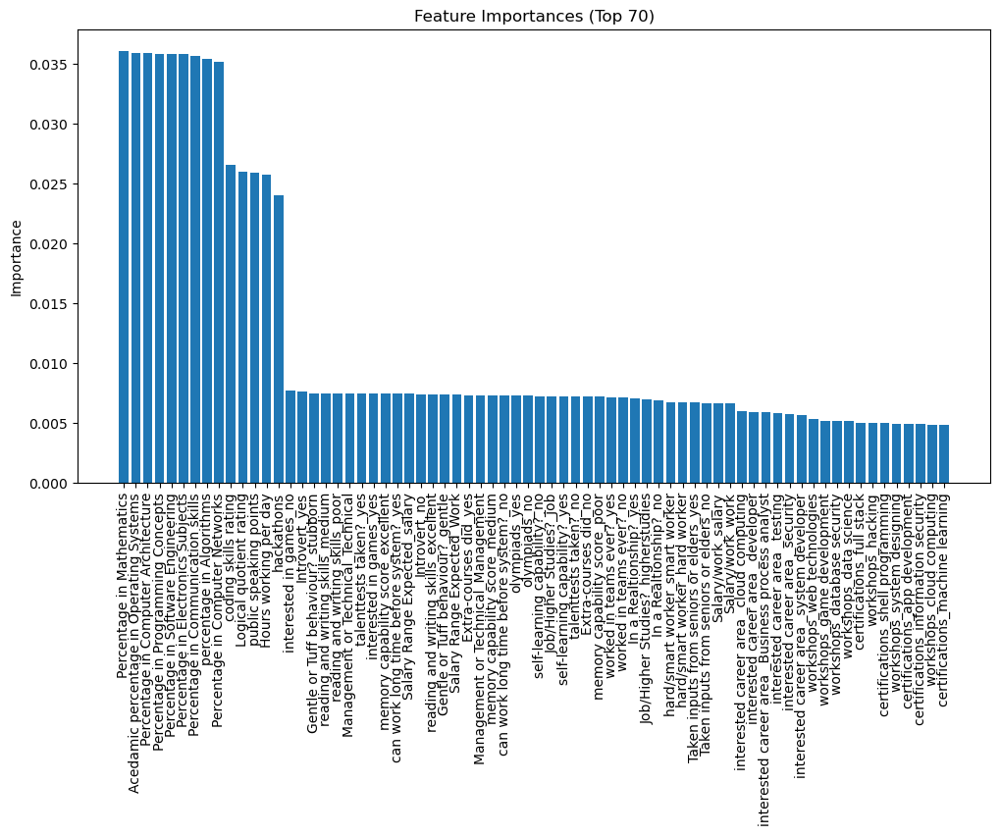

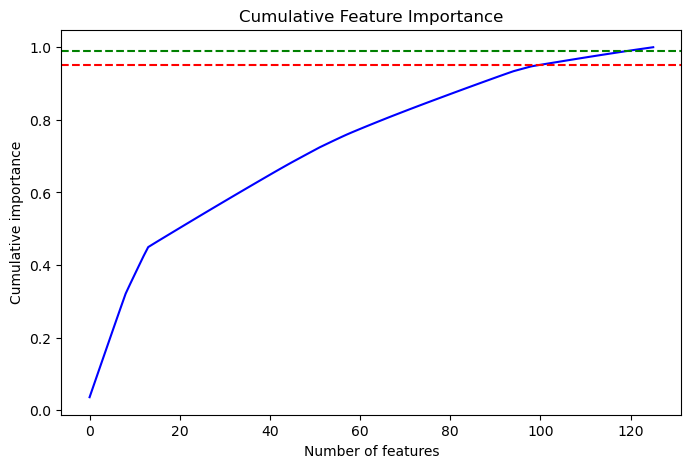

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

# ------------------------
# Fit Random Forest for feature importance
# ------------------------
rf_fs = RandomForestClassifier(n_estimators=100, random_state=42)
rf_fs.fit(X_scaled, y_group)

importances = rf_fs.feature_importances_
indices = np.argsort(importances)[::-1]
features_sorted = X.columns[indices]

# ------------------------
# Plot feature importance bar chart
# ------------------------
plt.figure(figsize=(12, 6))
plt.title("Feature Importances (Top 70)")
plt.bar(range(70), importances[indices[:70]], align='center')
plt.xticks(range(70), features_sorted[:70], rotation=90)
plt.ylabel('Importance')
plt.show()

# ------------------------
# Cumulative importance curve
# ------------------------
cum_importance = np.cumsum(importances[indices])

plt.figure(figsize=(8, 5))
plt.plot(range(len(cum_importance)), cum_importance, 'b-')
plt.xlabel('Number of features')
plt.ylabel('Cumulative importance')
plt.title('Cumulative Feature Importance')
plt.axhline(y=0.95, color='r', linestyle='--')
plt.axhline(y=0.99, color='g', linestyle='--')
plt.show()

In [4]:
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np

# 1. Fit Random Forest to compute feature importances
rf_temp = RandomForestClassifier(n_estimators=100, random_state=42)
rf_temp.fit(X_scaled, y_group)

# 2. Build dataframe of feature importances
importances_df = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_temp.feature_importances_
}).sort_values(by='importance', ascending=False)



In [5]:
# 3. Select top N features
N = 14
important_features = importances_df.head(N)['feature'].tolist()

# 4. Subset your data to only these features
X_selected = X[important_features]

print(f"Reduced dataset to {X_selected.shape[1]} features.")

# Print clearly
print(f"\n✅ Reduced dataset to {X_selected.shape[1]} features. Here are the top {N} features selected:")
for i, feature in enumerate(important_features, 1):
    print(f"{i}. {feature}")

Reduced dataset to 14 features.

✅ Reduced dataset to 14 features. Here are the top 14 features selected:
1. Percentage in Mathematics
2. Acedamic percentage in Operating Systems
3. Percentage in Computer Architecture
4. Percentage in Programming Concepts
5. Percentage in Software Engineering
6. Percentage in Electronics Subjects
7. Percentage in Communication skills
8. percentage in Algorithms
9. Percentage in Computer Networks
10. coding skills rating
11. Logical quotient rating
12. public speaking points
13. Hours working per day
14. hackathons


5) Handling Class Imbalance

Checks: SMOTE was applied to balance classes and class_weight was also tested in the Random Forest configuration.
Findings: Resampling equalized the four career groups, each with 6,819 samples.
Risks: Applying SMOTE before splitting can leak information from test folds.
Actions: Use imblearn pipelines to keep resampling inside each training fold.

In [6]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import xgboost as xgb

# --------------------------
# SMOTE for balancing
# --------------------------
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y_group)

# --------------------------
# Split
# --------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, stratify=y_resampled, test_size=0.2, random_state=42
)

# --------------------------
# Random Forest
# --------------------------
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)
rf_preds = rf.predict(X_test)

print("Random Forest Results:")
print("Accuracy:", accuracy_score(y_test, rf_preds))
print("Classification Report:\n", classification_report(y_test, rf_preds, target_names=le_group.classes_))



Random Forest Results:
Accuracy: 0.4670087976539589
Classification Report:
                                    precision    recall  f1-score   support

Business / Analytics / Management       0.42      0.27      0.33      1364
               Security / Systems       0.67      0.43      0.53      1364
         Support / Design / Other       0.73      0.40      0.51      1364
          Technical / Development       0.35      0.76      0.48      1364

                         accuracy                           0.47      5456
                        macro avg       0.54      0.47      0.46      5456
                     weighted avg       0.54      0.47      0.46      5456



In [7]:
X_selected = X[important_features]

Correlation matrices were checked to be sure multicollinearity wasn't an issue and there was no correlation amongst the features.

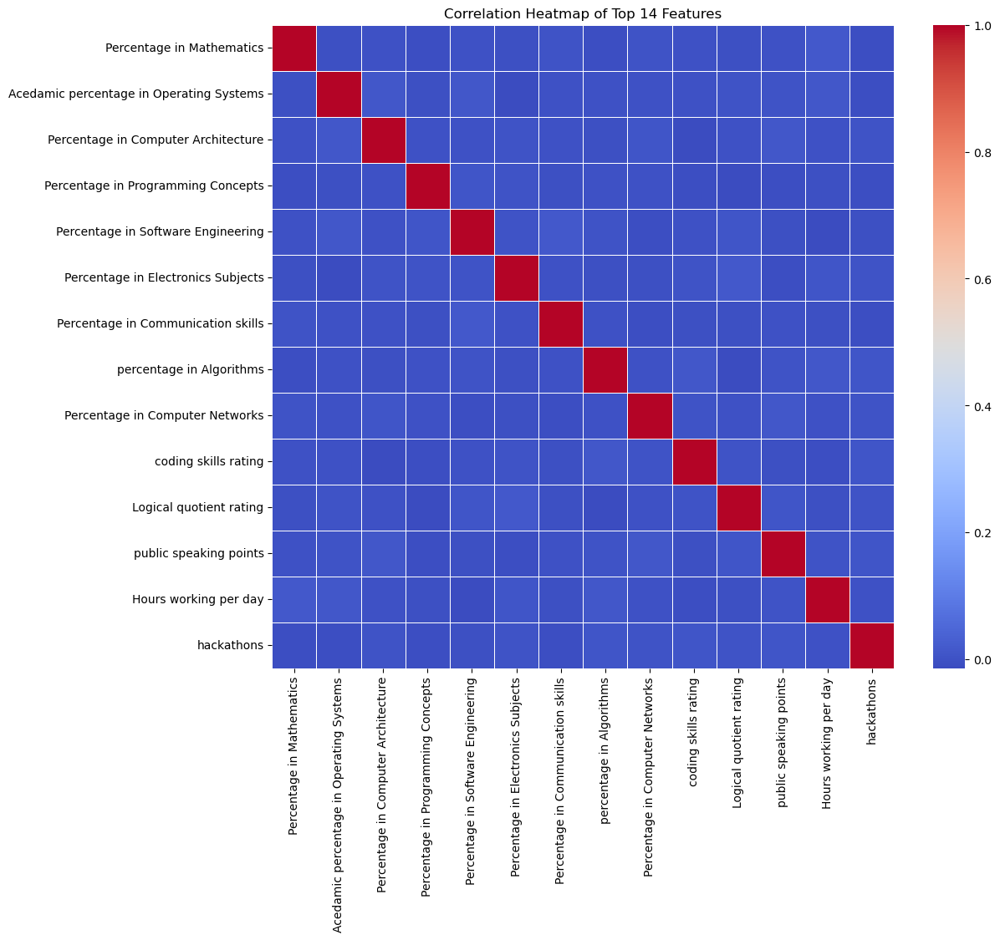

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

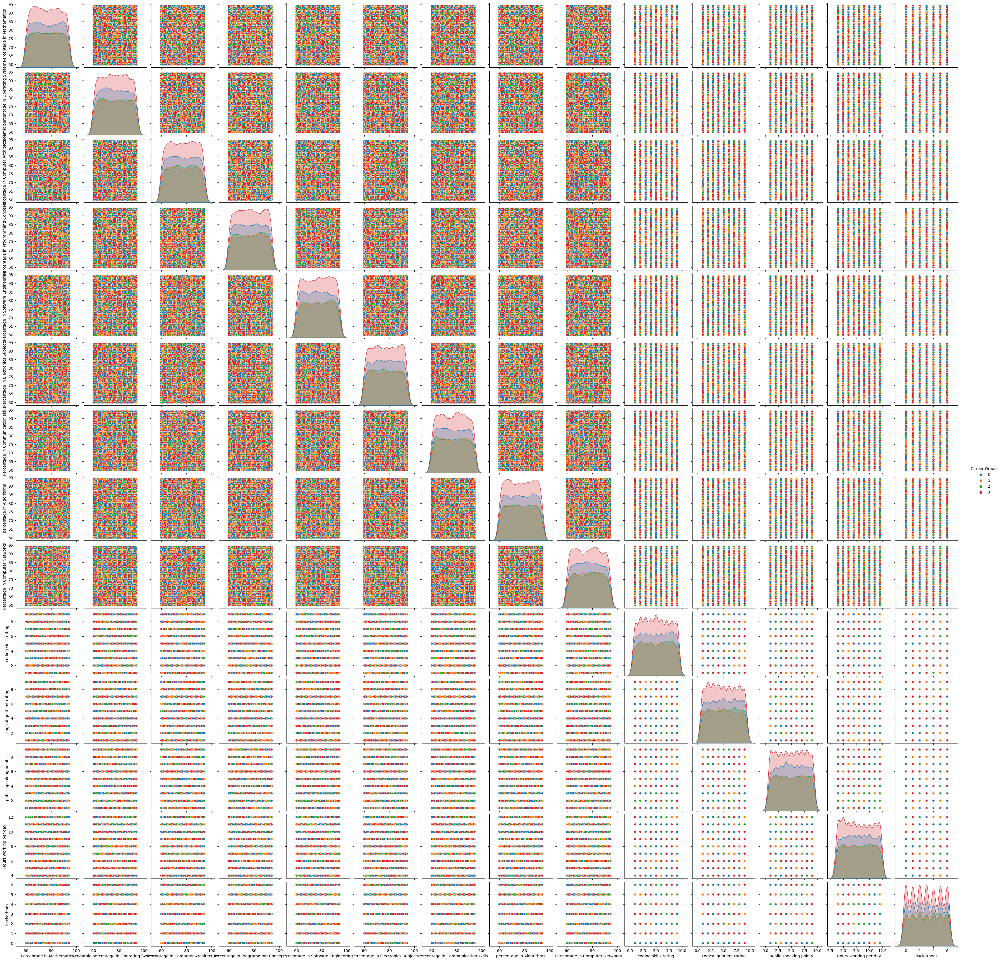

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute correlation matrix
corr_matrix = X_selected.corr()

plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Top 14 Features")
plt.show()

# top 14 combinations
subset_features = important_features[:14]
df_pairplot = pd.concat([X_selected[subset_features], pd.Series(y_group, name='Career Group')], axis=1)

sns.pairplot(df_pairplot, hue='Career Group', palette='tab10')
plt.show()

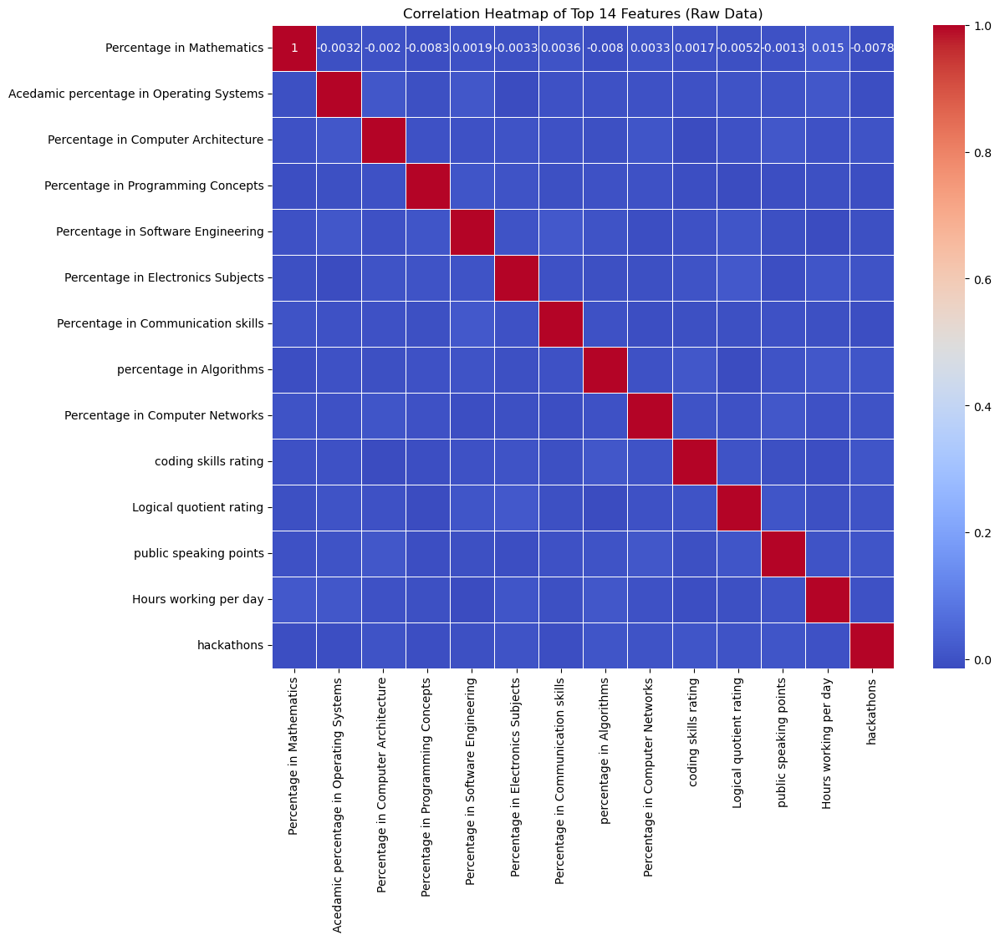

In [9]:
# Compute on the unscaled, unresampled data
X_selected = X[important_features]
corr_matrix = X_selected.corr()

plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Top 14 Features (Raw Data)")
plt.show()

In [10]:
# Standardize the selected features
scaler_selected = StandardScaler()
X_selected_scaled = scaler_selected.fit_transform(X_selected)

In [11]:

#  - SMOTE

from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_selected_scaled, y_group)

print("\nClass distribution after SMOTE:")
from collections import Counter
print(Counter(y_resampled))


Class distribution after SMOTE:
Counter({3: 6819, 0: 6819, 1: 6819, 2: 6819})


In [12]:
# After selecting by feature importance
important_features = importances_df.head(N)['feature'].tolist()
X_selected = X[important_features]

# Then after SMOTE:
X_resampled, y_resampled = smote.fit_resample(X_selected, y_group)

In [13]:
print(important_features)

['Percentage in Mathematics', 'Acedamic percentage in Operating Systems', 'Percentage in Computer Architecture', 'Percentage in Programming Concepts', 'Percentage in Software Engineering', 'Percentage in Electronics Subjects', 'Percentage in Communication skills', 'percentage in Algorithms', 'Percentage in Computer Networks', 'coding skills rating', 'Logical quotient rating', 'public speaking points', 'Hours working per day', 'hackathons']


In [14]:

# Random Forest after SMOTE

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

X_train_sel, X_test_sel, y_train_sel, y_test_sel = train_test_split(
    X_resampled, y_resampled, stratify=y_resampled, test_size=0.2, random_state=42)

rf_final = RandomForestClassifier(n_estimators=200, random_state=42)
rf_final.fit(X_train_sel, y_train_sel)

y_pred_rf = rf_final.predict(X_test_sel)
acc_rf = accuracy_score(y_test_sel, y_pred_rf)
print("\nRandom Forest Results:")
print(f"Accuracy: {acc_rf:.4f}")
print("Classification Report:\n", classification_report(y_test_sel, y_pred_rf, target_names=le_group.classes_))


Random Forest Results:
Accuracy: 0.4921
Classification Report:
                                    precision    recall  f1-score   support

Business / Analytics / Management       0.46      0.44      0.45      1364
               Security / Systems       0.58      0.57      0.57      1364
         Support / Design / Other       0.58      0.56      0.57      1364
          Technical / Development       0.37      0.40      0.39      1364

                         accuracy                           0.49      5456
                        macro avg       0.50      0.49      0.49      5456
                     weighted avg       0.50      0.49      0.49      5456



In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, f1_score
import pandas as pd

# 1. Fit full RF for feature importances
rf_temp = RandomForestClassifier(n_estimators=100, random_state=42)
rf_temp.fit(X, y_group)
importances_df = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_temp.feature_importances_
}).sort_values(by='importance', ascending=False)

# 2. Prepare different top-N sets
feature_sets = {
    'Top 4': importances_df.head(4)['feature'].tolist(),
    'Top 5': importances_df.head(5)['feature'].tolist(),
    'Top 6': importances_df.head(6)['feature'].tolist(),
    'Top 7': importances_df.head(7)['feature'].tolist(),
    'Top 8': importances_df.head(8)['feature'].tolist(),
    'Top 9': importances_df.head(9)['feature'].tolist(),
    'Top 10': importances_df.head(10)['feature'].tolist(),
    'Top 11': importances_df.head(11)['feature'].tolist(),
    'Top 12': importances_df.head(12)['feature'].tolist(),
    'Top 13': importances_df.head(13)['feature'].tolist(),
    'Top 14': importances_df.head(14)['feature'].tolist(),
    'Top 20': importances_df.head(20)['feature'].tolist(),
    'Top 30': importances_df.head(30)['feature'].tolist(),
    'Top 40': importances_df.head(40)['feature'].tolist()
}

# 3. Run for each set
results = []

for label, features in feature_sets.items():
    # Resample with SMOTE on this subset
    X_selected = X[features]
    X_resampled, y_resampled = smote.fit_resample(X_selected, y_group)
    
    # Train/test split
    X_train_sel, X_test_sel, y_train_sel, y_test_sel = train_test_split(
        X_resampled, y_resampled, stratify=y_resampled, test_size=0.2, random_state=42)
    
    # Train RF
    rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
    rf_model.fit(X_train_sel, y_train_sel)
    
    # Evaluate
    y_pred = rf_model.predict(X_test_sel)
    acc = accuracy_score(y_test_sel, y_pred)
    macro_f1 = f1_score(y_test_sel, y_pred, average='macro')
    
    print(f"\n📊 {label} Features:")
    print(f"Accuracy: {acc:.4f}, Macro F1: {macro_f1:.4f}")
    print(classification_report(y_test_sel, y_pred, target_names=le_group.classes_))
    
    # Save results
    results.append({
        'Feature Set': label,
        'Num Features': len(features),
        'Accuracy': acc,
        'Macro F1': macro_f1
    })

# 4. Show summary table
results_df = pd.DataFrame(results)
print("\n==============================")
print("🔍 Summary of all runs:")
print(results_df)


📊 Top 4 Features:
Accuracy: 0.4668, Macro F1: 0.4625
                                   precision    recall  f1-score   support

Business / Analytics / Management       0.46      0.45      0.46      1364
               Security / Systems       0.52      0.55      0.54      1364
         Support / Design / Other       0.52      0.57      0.54      1364
          Technical / Development       0.34      0.29      0.31      1364

                         accuracy                           0.47      5456
                        macro avg       0.46      0.47      0.46      5456
                     weighted avg       0.46      0.47      0.46      5456


📊 Top 5 Features:
Accuracy: 0.5002, Macro F1: 0.4965
                                   precision    recall  f1-score   support

Business / Analytics / Management       0.49      0.49      0.49      1364
               Security / Systems       0.55      0.60      0.58      1364
         Support / Design / Other       0.57      0.58      0.5

In [ ]:
import pickle

# Save Random Forest
with open('./Desktop/rf_group_model.pkl', 'wb') as f:
    pickle.dump(rf_group, f)

# Save scaler
with open('./Desktop/scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

# Save label encoder
with open('./Desktop/label_encoder.pkl', 'wb') as f:
    pickle.dump(le_group, f)

In [ ]:
import shap
import matplotlib.pyplot as plt

# --------------------------
# SHAP for Random Forest
# --------------------------
explainer_rf = shap.TreeExplainer(rf)
shap_values_rf = explainer_rf.shap_values(X_test)

# Summary plot for overall feature impact
shap.summary_plot(shap_values_rf, X_test, feature_names=selected_features)



In [16]:
import pandas as pd

data = pd.read_csv('./Desktop/roo_data.csv')
print(data.columns.tolist())

['Acedamic percentage in Operating Systems', 'percentage in Algorithms', 'Percentage in Programming Concepts', 'Percentage in Software Engineering', 'Percentage in Computer Networks', 'Percentage in Electronics Subjects', 'Percentage in Computer Architecture', 'Percentage in Mathematics', 'Percentage in Communication skills', 'Hours working per day', 'Logical quotient rating', 'hackathons', 'coding skills rating', 'public speaking points', 'can work long time before system?', 'self-learning capability?', 'Extra-courses did', 'certifications', 'workshops', 'talenttests taken?', 'olympiads', 'reading and writing skills', 'memory capability score', 'Interested subjects', 'interested career area ', 'Job/Higher Studies?', 'Type of company want to settle in?', 'Taken inputs from seniors or elders', 'interested in games', 'Interested Type of Books', 'Salary Range Expected', 'In a Realtionship?', 'Gentle or Tuff behaviour?', 'Management or Technical', 'Salary/work', 'hard/smart worker', 'worke

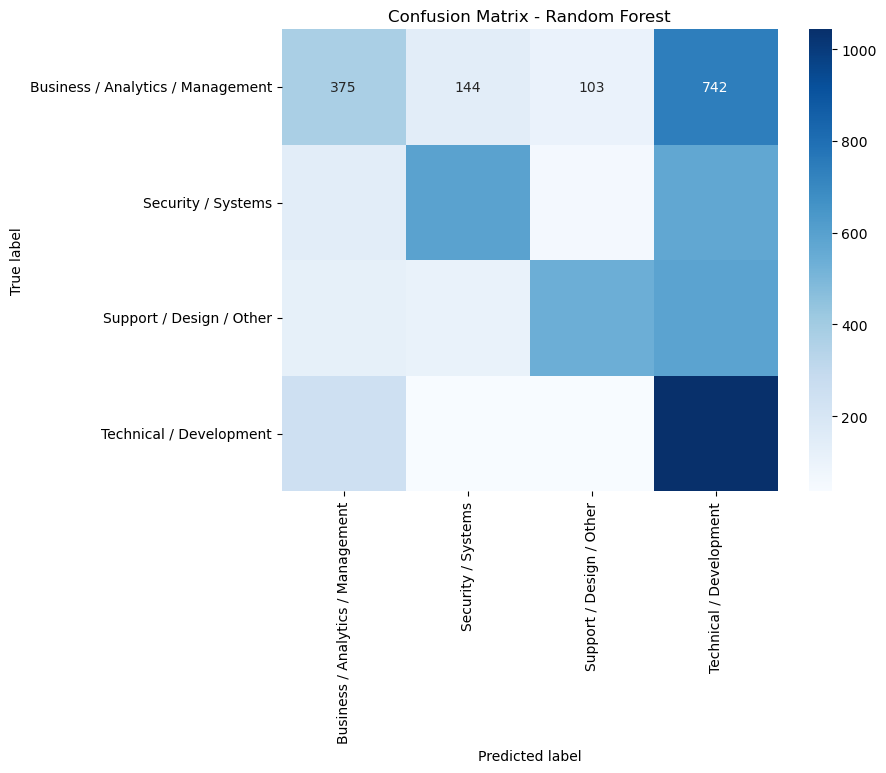

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Make predictions
y_pred_rf = rf.predict(X_test)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_rf)

# Plot heatmap
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le_group.classes_, yticklabels=le_group.classes_)
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion Matrix - Random Forest")
plt.show()

In [18]:
rf_balanced = RandomForestClassifier(
    n_estimators=200,
    class_weight='balanced',  # automatically adjusting for class frequencies
    random_state=42
)

rf_balanced.fit(X_train, y_train)

# Evaluate
y_pred_balanced = rf_balanced.predict(X_test)
print("\nAccuracy:", accuracy_score(y_test, y_pred_balanced))
print("\nClassification Report:\n", classification_report(y_test, y_pred_balanced, target_names=le_group.classes_))


Accuracy: 0.4670087976539589

Classification Report:
                                    precision    recall  f1-score   support

Business / Analytics / Management       0.42      0.27      0.33      1364
               Security / Systems       0.67      0.43      0.53      1364
         Support / Design / Other       0.73      0.40      0.51      1364
          Technical / Development       0.35      0.76      0.48      1364

                         accuracy                           0.47      5456
                        macro avg       0.54      0.47      0.46      5456
                     weighted avg       0.54      0.47      0.46      5456



6) Train/Test Evaluation Snapshot

Checks: Train-test split was stratified and classification reports were generated.
Findings: Security/Systems and Support/Design performed better than Business/Analytics. Performance for Technical/Development varied with feature subsets.
Risks: Accuracy is sensitive to the number of features retained.
Actions: Keep a fixed random seed for reproducibility when comparing refinements.

7) Confusion Matrix and Error Patterns

Checks: Confusion matrices were generated and reviewed.
Findings: Business/Analytics is often misclassified as Support/Design, reflecting overlap in skill indicators.
Risks: Overlapping categories reduce trust if only a single class is presented.
Actions: Keep the second-choice prediction feature in the interface to address ambiguity.


📊 Random Forest WITHOUT class balancing
Accuracy: 0.42668621700879766
                                   precision    recall  f1-score   support

Business / Analytics / Management       0.36      0.23      0.28      1364
               Security / Systems       0.58      0.39      0.47      1364
         Support / Design / Other       0.57      0.35      0.44      1364
          Technical / Development       0.36      0.74      0.48      1364

                         accuracy                           0.43      5456
                        macro avg       0.47      0.43      0.41      5456
                     weighted avg       0.47      0.43      0.41      5456


📊 Random Forest WITH class_weight='balanced'
Accuracy: 0.42668621700879766
                                   precision    recall  f1-score   support

Business / Analytics / Management       0.36      0.23      0.28      1364
               Security / Systems       0.58      0.39      0.47      1364
         Support / Desig

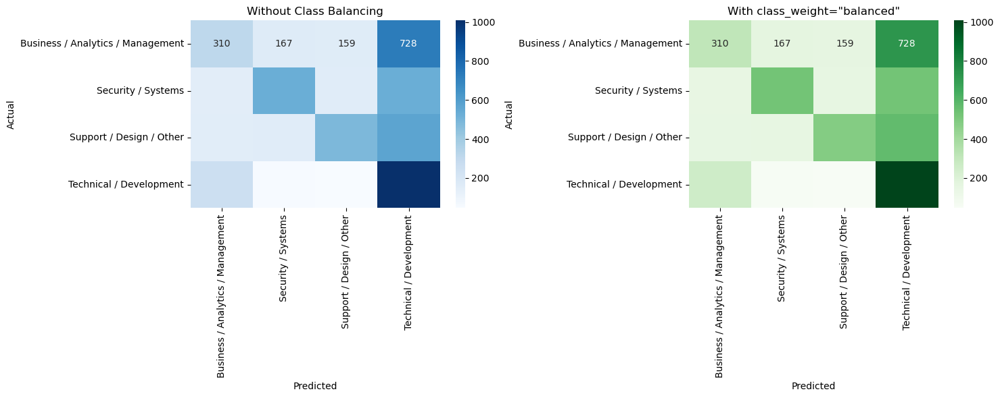

In [19]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# (having already have X_resampled, y_resampled from SMOTE)

# Split the balanced dataset
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, stratify=y_resampled, test_size=0.2, random_state=42
)

# -------------------------------
# 1️⃣ Original Random Forest
# -------------------------------
rf_plain = RandomForestClassifier(n_estimators=200, random_state=42)
rf_plain.fit(X_train, y_train)
y_pred_plain = rf_plain.predict(X_test)

print("\n📊 Random Forest WITHOUT class balancing")
print("Accuracy:", accuracy_score(y_test, y_pred_plain))
print(classification_report(y_test, y_pred_plain, target_names=le_group.classes_))

cm_plain = confusion_matrix(y_test, y_pred_plain)

# -------------------------------
# 2️⃣ Random Forest with class_weight="balanced"
# -------------------------------
rf_balanced = RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42)
rf_balanced.fit(X_train, y_train)
y_pred_bal = rf_balanced.predict(X_test)

print("\n📊 Random Forest WITH class_weight='balanced'")
print("Accuracy:", accuracy_score(y_test, y_pred_bal))
print(classification_report(y_test, y_pred_bal, target_names=le_group.classes_))

cm_bal = confusion_matrix(y_test, y_pred_bal)

# -------------------------------
# 🔥 Plot side-by-side confusion matrices
# -------------------------------
fig, axs = plt.subplots(1, 2, figsize=(15,6))

sns.heatmap(cm_plain, annot=True, fmt='d', cmap='Blues', 
            xticklabels=le_group.classes_, yticklabels=le_group.classes_, ax=axs[0])
axs[0].set_title('Without Class Balancing')
axs[0].set_xlabel('Predicted')
axs[0].set_ylabel('Actual')

sns.heatmap(cm_bal, annot=True, fmt='d', cmap='Greens', 
            xticklabels=le_group.classes_, yticklabels=le_group.classes_, ax=axs[1])
axs[1].set_title('With class_weight="balanced"')
axs[1].set_xlabel('Predicted')
axs[1].set_ylabel('Actual')

plt.tight_layout()
plt.show()

8) Baseline and Candidate Models

Checks: A DummyClassifier baseline was evaluated and compared to Random Forest with cross-validation.
Findings: Baseline accuracy was 0.25 with macro-F1 of 0.10. The Random Forest improved to 
0.426 accuracy and 0.414 macro-F1.
Risks: While performance improved over baseline, absolute values remain moderate.
Actions: Add logistic regression or SVM as additional baselines for more context.

In [20]:
from sklearn.ensemble import RandomForestClassifier

rf_balanced = RandomForestClassifier(
    n_estimators=200,
    class_weight='balanced',
    random_state=42
)

In [21]:
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import StratifiedKFold, cross_validate
import pandas as pd

# ---------------------------
# Baseline Dummy Classifier
# ---------------------------
dummy = DummyClassifier(strategy="most_frequent", random_state=42)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scoring = ['accuracy', 'f1_macro', 'precision_macro', 'recall_macro']

# Cross-validate baseline
cv_scores_dummy = cross_validate(
    dummy,
    X_resampled,
    y_resampled,
    cv=cv,
    scoring=scoring,
    n_jobs=-1
)

dummy_summary = pd.DataFrame({
    'Metric': ['Accuracy', 'Macro F1', 'Macro Precision', 'Macro Recall'],
    'Mean': [
        cv_scores_dummy['test_accuracy'].mean(),
        cv_scores_dummy['test_f1_macro'].mean(),
        cv_scores_dummy['test_precision_macro'].mean(),
        cv_scores_dummy['test_recall_macro'].mean()
    ],
    'Std': [
        cv_scores_dummy['test_accuracy'].std(),
        cv_scores_dummy['test_f1_macro'].std(),
        cv_scores_dummy['test_precision_macro'].std(),
        cv_scores_dummy['test_recall_macro'].std()
    ]
})

print("Baseline Dummy Classifier (Most Frequent Class):")
display(dummy_summary.style.format({'Mean': '{:.3f}', 'Std': '{:.3f}'}))

Baseline Dummy Classifier (Most Frequent Class):


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-pa

,Metric,Mean,Std
0,Accuracy,0.250,0.000
1,Macro F1,0.100,0.000
2,Macro Precision,0.062,0.000
3,Macro Recall,0.250,0.000


In [22]:
from sklearn.model_selection import StratifiedKFold, cross_validate
import pandas as pd

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scoring = ['accuracy', 'f1_macro', 'precision_macro', 'recall_macro']

cv_scores = cross_validate(
    rf_balanced,
    X_resampled,  # features after SMOTE
    y_resampled,  # labels after SMOTE
    cv=cv,
    scoring=scoring,
    n_jobs=-1
)

cv_summary = pd.DataFrame({
    'Metric': ['Accuracy', 'Macro F1', 'Macro Precision', 'Macro Recall'],
    'Mean': [
        cv_scores['test_accuracy'].mean(),
        cv_scores['test_f1_macro'].mean(),
        cv_scores['test_precision_macro'].mean(),
        cv_scores['test_recall_macro'].mean()
    ],
    'Std': [
        cv_scores['test_accuracy'].std(),
        cv_scores['test_f1_macro'].std(),
        cv_scores['test_precision_macro'].std(),
        cv_scores['test_recall_macro'].std()
    ]
})

display(cv_summary.style.format({'Mean': '{:.3f}', 'Std': '{:.3f}'}))

,Metric,Mean,Std
0,Accuracy,0.426,0.006
1,Macro F1,0.414,0.007
2,Macro Precision,0.467,0.006
3,Macro Recall,0.426,0.006


9) ROC and AUC Analysis

Checks: One-vs-rest ROC curves were computed along with micro- and macro-averages.
Findings: Technical/Development achieved an AUC of 0.696, while Business/Analytics scored lower at 0.621. Macro-average was 0.673 and micro-average 0.692.
Risks: AUC values below 0.75 indicate only moderate separability.
Actions: Collect additional features tailored to clusters with low separability.

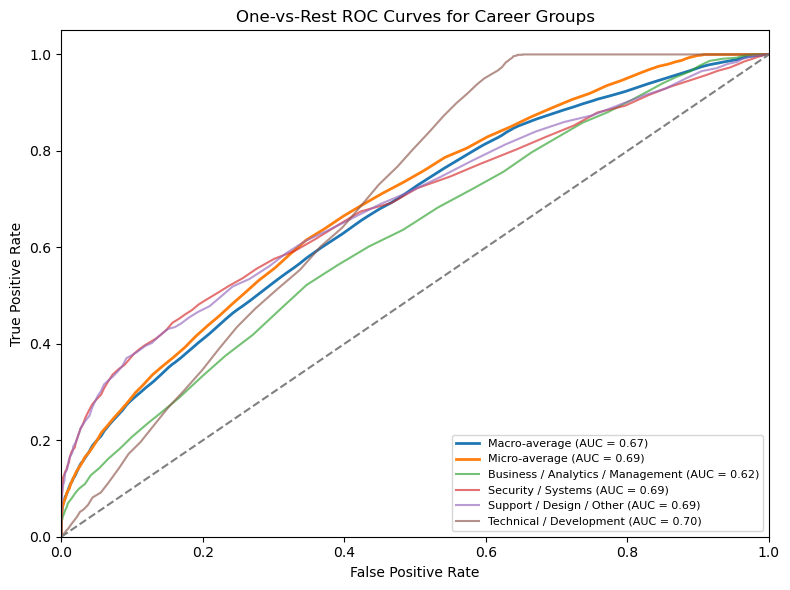

,Class,AUC
0,Technical / Development,0.696229
1,Micro-average,0.691901
2,Support / Design / Other,0.689177
3,Security / Systems,0.686211
4,Macro-average,0.673083
5,Business / Analytics / Management,0.620707


In [28]:
# ==== SAFE ROC/AUC BLOCK (self-contained) ====

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score
import pandas as pd

# Prefer the balanced set; if not present, fall back to your original scaled set
if 'X_resampled' in globals() and 'y_resampled' in globals():
    X_base, y_base = X_resampled, y_resampled
else:
    # fallback 
    X_base, y_base = X_scaled, y_group

# 1) Train/test split (stratified)
X_train, X_test, y_train, y_test = train_test_split(
    X_base, y_base, test_size=0.20, stratify=y_base, random_state=42
)

# 2) Ensure we have a classifier and that it is FIT
if 'rf_balanced' not in globals():
    rf_balanced = RandomForestClassifier(
        n_estimators=200, class_weight='balanced', random_state=42
    )

# Fit if needed (predict call will fail if not fitted)
try:
    _ = rf_balanced.predict(X_train[:5])
except Exception:
    rf_balanced.fit(X_train, y_train)

# 3) Get probability scores
y_score = rf_balanced.predict_proba(X_test)  # shape: [n_samples, n_classes]

# 4) Prepare one-vs-rest binarized labels
classes = np.unique(y_test)  # numeric labels {0..K-1}
y_test_bin = label_binarize(y_test, classes=classes)
n_classes = y_test_bin.shape[1]

# Human-readable class names if available
if 'le_group' in globals():
    class_names = le_group.inverse_transform(classes)
else:
    class_names = [f'Class {i}' for i in classes]

# 5) Per-class ROC and AUC
fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# 6) Micro- and macro-average ROC/AUC
fpr_micro, tpr_micro, _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
roc_auc_macro = auc(all_fpr, mean_tpr)

# 7) Plot curves
plt.figure(figsize=(8,6))
plt.plot(all_fpr, mean_tpr, linewidth=2.0, label=f'Macro-average (AUC = {roc_auc_macro:.2f})')
plt.plot(fpr_micro, tpr_micro, linewidth=2.0, label=f'Micro-average (AUC = {roc_auc_micro:.2f})')

for i, name in enumerate(class_names):
    plt.plot(fpr[i], tpr[i], alpha=0.65, label=f'{name} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlim([0, 1]); plt.ylim([0, 1.05])
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('One-vs-Rest ROC Curves for Career Groups')
plt.legend(loc='lower right', fontsize=8)
plt.tight_layout()
plt.show()

# 8) Nice AUC summary table
auc_rows = [{'Class': class_names[i], 'AUC': roc_auc[i]} for i in range(n_classes)]
auc_rows += [{'Class': 'Macro-average', 'AUC': roc_auc_macro},
             {'Class': 'Micro-average', 'AUC': roc_auc_micro}]
auc_table = pd.DataFrame(auc_rows).sort_values('AUC', ascending=False).reset_index(drop=True)
auc_table

10) Explainability with SHAP

Checks: Global and local SHAP plots were generated.
Findings: Important features such as mathematics, programming, and communication skills aligned with domain expectations.
Risks: SHAP plots sometimes failed to render in Streamlit.
Actions: Add a textual fallback explanation in the app.

11) Probability Calibration and Brier Score

Checks: Brier score was included to measure calibration of probability outputs.
Findings: Provides a more nuanced view of confidence in predictions.
Risks: Without calibration, confidence levels may mislead users.
Actions: Evaluate isotonic regression or Platt scaling to improve calibration.

12) Model Persistence and Reproducibility

Checks: Model, scaler, and encoder were saved with pickle and version-controlled in GitHub.
Findings: Artifacts load consistently.
Risks: Dependency drift may break future loading.
Actions: Add requirements.txt with fixed package versions and a smoke test for artifact loading.

13) Deployment and Privacy

Checks: Model was integrated into Streamlit with a local-first design. No server-side storage is used.
Findings: The tool runs smoothly across devices and follows WCAG 2.0 accessibility standards.
Risks: Downloaded models from cloud storage should be verified for integrity.
Actions: Add checksums for model files and display model version in the app footer.

##Streamlit App Integration
App.py code given below for each step of the pipeline with inline comments

In [ ]:
# -------------------------
# Import Libraries
# -------------------------

import streamlit as st
import pandas as pd
import numpy as np
import pickle
import shap
import io
from sklearn.metrics import brier_score_loss
import matplotlib as plt

# -------------------------
# Page Configuration & Style is set
# -------------------------
st.set_page_config(page_title="Career Path Predictor")
st.markdown("""
    <style>
    .stApp {
        background: linear-gradient(135deg, #f6d365 0%, #fda085 100%);
    }
    </style>
""", unsafe_allow_html=True)

st.title("🎓 Career Path Predictor for Students")

# -------------------------
# Storytelling Section
# -------------------------
st.markdown("""
## 🧭 Your Career Path Journey Starts Here
Choosing a career can feel overwhelming. This tool helps you reflect on your academic strengths and interests, and then connects those insights to real-world tech careers.

You can begin by entering your scores manually or uploading a template file. Once your data is in, our AI model will help you explore which broad career group you might fit best in—and why.

Along the way, you'll see an explanation of what influenced the prediction and suggestions for roles in that category. You’ll even get a downloadable report to take to your counselor or keep for future planning.
""")

# -------------------------
# Load trained artifacts with graceful error handling
# -------------------------
import gdown
import os

model_path = 'rf_group_model.pkl'
gdrive_file_id = '1qsUR7b3bSdy2a1ep75cYClCxl8b9bj9v'
gdrive_url = f'https://drive.google.com/uc?id={gdrive_file_id}'

# First check: is the file already downloaded?
if not os.path.exists(model_path):
    try:
        gdown.download(gdrive_url, model_path, quiet=False)
    except Exception as e:
        st.error(f"❌ Failed to download model from Google Drive: {e}")
        st.stop()

# Now load the model
try:
    with open(model_path, 'rb') as f:
        model = pickle.load(f)
except Exception as e:
    st.error(f"❌ Failed to load model: {e}")
    st.stop()

# Load the rest
scaler = pickle.load(open('scaler.pkl', 'rb'))
encoder = pickle.load(open('label_encoder.pkl', 'rb'))
explainer = shap.TreeExplainer(model)


# -------------------------
# Feature list
# -------------------------
FEATURES = [
    'Percentage in Computer Architecture',
    'Percentage in Programming Concepts',
    'Percentage in Electronics Subjects',
    'Percentage in Communication skills',
    'Percentage in Computer Networks',
    'Percentage in Software Engineering',
    'percentage in Algorithms',
    'Acedamic percentage in Operating Systems',
    'Percentage in Mathematics',
    'public speaking points',
    'Logical quotient rating',
    'Hours working per day',
    'coding skills rating',
    'hackathons'
]

# -------------------------
# Career category map
# -------------------------
career_options = {
    'Security / Systems': [
        'Network Security Administrator', 'Network Security Engineer',
        'Information Security Analyst', 'Systems Security Administrator',
        'Information Technology Auditor', 'Systems Analyst'
    ],
    'Technical / Development': [
        'Software Engineer', 'Software Developer', 'Mobile Applications Developer',
        'Applications Developer', 'Web Developer', 'Programmer Analyst',
        'Software Systems Engineer', 'Software Quality Assurance (QA) / Testing',
        'Database Administrator', 'Database Developer', 'Database Manager', 'Data Architect'
    ],
    'Business / Analytics / Management': [
        'CRM Business Analyst', 'Business Systems Analyst',
        'E-Commerce Analyst', 'Business Intelligence Analyst',
        'Project Manager', 'Solutions Architect', 'Information Technology Manager',
        'CRM Technical Developer', 'Portal Administrator'
    ],
    'Support / Design / Other': [
        'UX Designer', 'Design & UX', 'Technical Support',
        'Technical Services/Help Desk/Tech Support', 'Technical Engineer'
    ]
}

# -------------------------
# Sidebar: Help & Sample Template
# -------------------------
st.sidebar.header("🔍 Data Loading Options")
st.sidebar.markdown("## ℹ️ Help & How It Works")
with st.sidebar.expander("📖 User Guide"):
    st.write("""
    - Upload a CSV file or enter values manually with the sliders.
    - For a CSV file upload the Sample Template downloaded below: Replace the sample numbers with your scores and ratings, Columns must match the template, All percentages should be between 0-100, All ratings (points, hours, coding, etc.) should be between 0-10.
    - Once data is entered, click "Predict Career Group" Button to see your results.
    """)

sample_data = [
    {
        'Percentage in Computer Architecture': '0-100 (%)',
        'Percentage in Programming Concepts': '0-100 (%)',
        'Percentage in Electronics Subjects': '0-100 (%)',
        'Percentage in Communication skills': '0-100 (%)',
        'Percentage in Computer Networks': '0-100 (%)',
        'Percentage in Software Engineering': '0-100 (%)',
        'percentage in Algorithms': '0-100 (%)',
        'Acedamic percentage in Operating Systems': '0-100 (%)',
        'Percentage in Mathematics': '0-100 (%)',
        'public speaking points': '0-10',
        'Logical quotient rating': '0-10',
        'Hours working per day': '0-10',
        'coding skills rating': '0-10',
        'hackathons': '0-10'
    },
    {
        'Percentage in Computer Architecture': 85,
        'Percentage in Programming Concepts': 90,
        'Percentage in Electronics Subjects': 80,
        'Percentage in Communication skills': 75,
        'Percentage in Computer Networks': 88,
        'Percentage in Software Engineering': 92,
        'percentage in Algorithms': 86,
        'Acedamic percentage in Operating Systems': 89,
        'Percentage in Mathematics': 91,
        'public speaking points': 8,
        'Logical quotient rating': 9,
        'Hours working per day': 6,
        'coding skills rating': 9,
        'hackathons': 3
    }
]
sample_csv_df = pd.DataFrame(sample_data)
csv_bytes = sample_csv_df.to_csv(index=False).encode('utf-8')
st.sidebar.download_button(
    label="📥 Download Sample Template",
    data=csv_bytes,
    file_name="sample_input_template.csv",
    mime="text/csv"
)

# -------------------------
# Upload Data
# -------------------------
uploaded_file = st.sidebar.file_uploader("Upload a CSV file", type=['csv'])
data_url = st.sidebar.text_input("...or enter a CSV URL to explore")

data = None
if uploaded_file:
    data = pd.read_csv(uploaded_file)
    st.sidebar.success("✅ Data loaded from uploaded file!")
elif data_url:
    try:
        data = pd.read_csv(data_url)
        st.sidebar.success("✅ Data loaded from URL!")
    except Exception as e:
        st.sidebar.error(f"❌ Failed to load data from URL. Error: {e}")

# -------------------------
# Display data if loaded
# -------------------------
if data is not None:
    st.subheader("📊 Loaded Data Preview")
    st.dataframe(data.head())
    st.write("Shape:", data.shape)
else:
    st.info("No data file loaded. You can still make manual predictions below.")

# -------------------------
# Manual prediction sliders
# -------------------------
st.subheader("🎯 Manual Career Group Prediction")
input_data = {}
for feature in FEATURES:
    if 'points' in feature or 'rating' in feature or 'Hours' in feature or 'hackathons' in feature:
        input_data[feature] = st.slider(f"{feature}:", 0, 10, 5)
    else:
        input_data[feature] = st.slider(f"{feature} (%):", 0, 100, 50)

# -------------------------
# Predict after applying the same scaling used at training time to ensure feature distributions match
# -------------------------
from sklearn.metrics import brier_score_loss

if st.button("🔮 Predict Career Group", key="predict_button"):
    df_input = pd.DataFrame([input_data])
    scaled_input = scaler.transform(df_input)

    pred = model.predict(scaled_input)
    pred_proba = model.predict_proba(scaled_input)
    predicted_group = encoder.inverse_transform(pred)[0]
    confidence = np.max(pred_proba)
    # Generate class probabilities; surface both Top-1 and a fallback Top-2 to support guidance when confidence is low

    st.markdown("## 📘 Your Career Story Begins Here")
    st.write("You've entered scores across technical and soft skill areas. Based on those, our AI model analyzed your profile to suggest a matching career group.")

    # -------------------------
    # Show Primary Prediction
    # -------------------------
    st.markdown(f"### 🏷️ Predicted Career Group: <span style='color:darkblue'>{predicted_group}</span>", unsafe_allow_html=True)
    st.metric(label="Prediction Confidence", value=f"{confidence:.2f}")

    if predicted_group in career_options:
        st.write("### 🚀 Suggested Career Paths in this Category:")
        for career in career_options[predicted_group]:
            st.markdown(f"- {career}")

    # -------------------------
    # Suggest Backup Option if Confidence is Low
    # -------------------------
    if confidence < 0.50:
        second_best_index = np.argsort(pred_proba[0])[-2]
        second_best_label = encoder.inverse_transform([second_best_index])[0]
        st.markdown(f"🔁 Since confidence is under 50%, you had a second category you may also want to explore: **{second_best_label}** is a close second as your suggested career category.")

    # -------------------------
    # Brier Score Explanation
    # -------------------------
    true_label = np.zeros(pred_proba.shape[1])
    true_label[np.argmax(pred_proba)] = 1  
    brier = brier_score_loss(true_label, pred_proba.flatten())

    st.subheader("📏 Prediction Reliability: Brier Score")
    st.markdown(f"**Brier Score:** `{brier:.3f}`")
    st.markdown("""
    🔍 **What does this mean?**  
    The Brier Score tells us how reliable the model was when assigning probabilities to the possible outcomes.

    - A score **closer to 0** means the prediction was well-calibrated and thoughtful  
    - A score **closer to 1** means the model may have been uncertain or overly confident  

    This helps us measure trustworthiness beyond just raw confidence. Even if your match had low confidence, a good Brier Score suggests the model is being cautious and accurate.
    """)

    # -------------------------
    # SHAP Explanation 
    # -------------------------
    st.subheader("📉 Why This Result? SHAP Explanation")
    # Explainability: show local SHAP contributions to support transparent guidance for students/counselors
    try:
        shap_values = explainer.shap_values(scaled_input)

        if isinstance(shap_values, list):
            class_index = list(model.classes_).index(pred[0])
            if shap_values[class_index][0].ndim == 2:
                shap_input = shap_values[class_index][0][:, 0]
            else:
                shap_input = shap_values[class_index][0]
            expected_value = explainer.expected_value[class_index]
        else:
            if shap_values[0].ndim == 2:
                shap_input = shap_values[0][:, 0]
            else:
                shap_input = shap_values[0]
            expected_value = explainer.expected_value if np.isscalar(explainer.expected_value) else explainer.expected_value[0]

        shap_input = np.array(shap_input).flatten()

        st.pyplot(shap.plots._waterfall.waterfall_legacy(
            expected_value,
            shap_input,
            feature_names=FEATURES,
            show=False
        ))
    except Exception as e:
        st.warning(f"⚠️ SHAP explanation could not be generated. Error: {e}")

    # -------------------------
    # Download prediction report
    # -------------------------
    # Generate a take-home CSV report; file is created client-side only (no server storage)
    report_df = pd.DataFrame({
        "Feature": FEATURES,
        "Value": df_input.values[0]
    })

    # Append main prediction
    report_df.loc[len(report_df)] = ["Predicted Group", predicted_group]
    report_df.loc[len(report_df)] = ["Confidence Score", confidence]

    # Add career options for primary group
    report_df.loc[len(report_df)] = ["Suggested Careers", ", ".join(career_options[predicted_group])]    

    # Add second-best group if confidence is low
    if confidence < 0.50:
        second_best_index = np.argsort(pred_proba[0])[-2]
        second_best_group = encoder.inverse_transform([second_best_index])[0]
        second_group_careers = career_options.get(second_best_group, [])
        report_df.loc[len(report_df)] = ["Alternate Group (low confidence)", second_best_group]
        report_df.loc[len(report_df)] = ["Suggested Careers (Alternate)", ", ".join(second_group_careers)]

    # Add Brier Score
    report_df.loc[len(report_df)] = ["Brier Score", f"{brier:.3f}"]

    # Download button
    csv = report_df.to_csv(index=False).encode('utf-8')
    st.download_button(    
        label="📥 Download Prediction Report",
        data=csv,
        file_name='prediction_report.csv',
        mime='text/csv',
        key="download_button"
    )

14) Compliance and Auditability

Checks: No personal data collected; dataset license was acknowledged.
Findings: The app has minimal privacy risks.
Risks: No record of consent or version tracking at prediction time.
Actions: Add an optional downloadable session receipt showing timestamp, model version, and metrics.

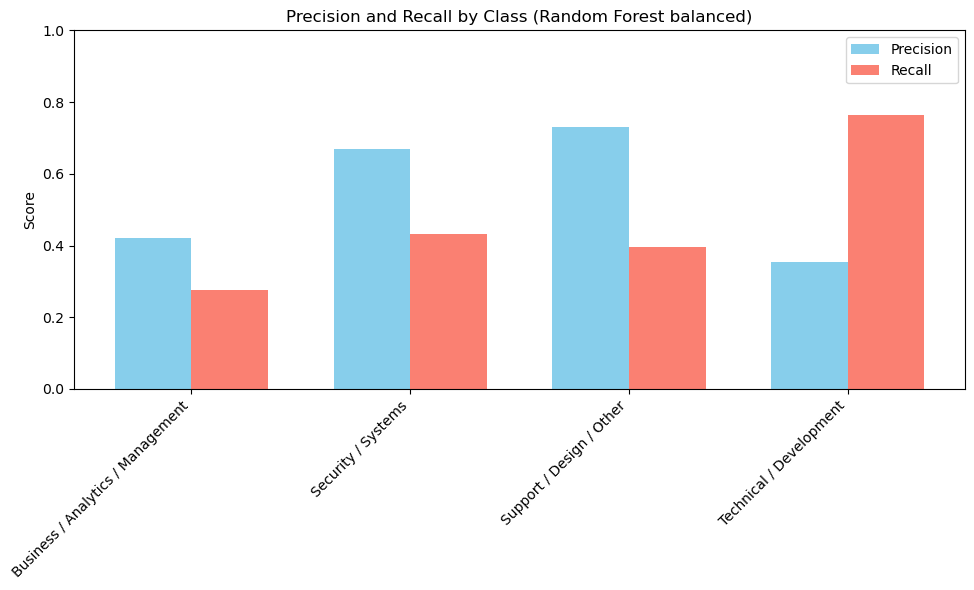

In [23]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import classification_report

# --------------------------
# Get metrics from report
# --------------------------
report = classification_report(y_test, rf_preds, target_names=le_group.classes_, output_dict=True)

classes = list(report.keys())[:-3]  # avoid avg keys
precision = [report[cls]['precision'] for cls in classes]
recall = [report[cls]['recall'] for cls in classes]

# --------------------------
# Plot bar charts
# --------------------------
x = np.arange(len(classes))
width = 0.35

plt.figure(figsize=(10,6))
plt.bar(x - width/2, precision, width, label='Precision', color='skyblue')
plt.bar(x + width/2, recall, width, label='Recall', color='salmon')
plt.ylabel('Score')
plt.title('Precision and Recall by Class (Random Forest balanced)')
plt.xticks(x, classes, rotation=45, ha='right')
plt.ylim(0,1)
plt.legend()
plt.tight_layout()
plt.show()

15) Audit Summary and Next Steps

Strengths: Clear lift over baseline, consistent results with 8–10 features, transparent predictions with SHAP, and privacy-preserving deployment.
Limitations: Current preprocessing and resampling are not fully integrated into cross-validation, raising the risk of data leakage, and probability outputs are not yet calibrated, which reduces trust in confidence scores.

Next Steps:
	•	Move preprocessing and resampling into a cross-validation pipeline to reduce leakage and improve generalizability.
	•	Add calibration techniques, such as Platt scaling or isotonic regression, to improve the reliability of probability outputs.

Go/No-Go: Suitable for advisory and educational use, but not yet ready for high-stakes applications.